In [1]:
# general eda imports
import pandas as pd
import numpy as np
import sqlite3
from scipy.stats import iqr
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# plotly imports
import plotly.express as px
import plotly as pl
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# tsa&prophet imports
from statsmodels.tsa.seasonal import STL
from prophet import Prophet
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
from prophet.plot import plot_cross_validation_metric
from prophet.plot import plot_plotly, plot_components_plotly

## Contents

* [Project description](#desc)
* [Import and preprocess the data](#ipreprocess)
    * [Import the data](#import)
    * [Data preprocess functions](#functions)
    * [Preprocess the data](#preprocess)
* [Data visualization](#vis)
    * [Plot the data for all year](#plot_year)
    * [Plot some period](#plot_period)
    * [Histograms for year data](#plot_hist)
    * [Data distributions by months - violin plots](#plot_violin)
    * [Temperature and humidity on one chart](#plot_two)
    * [Every day temperature from one year](#plot_everyday)
* [Time Series Analysis](#tsa)
    * [Check aggegated data](#tsa_check)
    * [TSA](#tsa_tsa)
        * [Plot the components of TSA](#tsa_comp)
* [Prediction by Prophet](#prophet)
    * [Preamble](#prophet_preamble)
    * [Prepare the data](#prophet_prep)
    * [Prophet instantiating, fit, predict](#prophet_inst)
    * [Interactive plots (plotly)](#prophet_plots)
    * [Cross-validation](#cross_val)
    * [Hyperparameter tuning](#hyper_tune)
    * [Fit and cross-validation with improved parameters](#fit_better)
        * [Forecast plots](#p_plots)
           * [Plot all the data](#p_plot_all)
           * [Plot components](#p_plot_comp)
        * [Cross-validation](#cross_val_2)
* [Conclusion](#conc)
* [Next steps](#next)

## Project description <a class="anchor" id="desc"></a>

I have the Raspberry Pi microcomputer for collecting enviroment data, such as temperature, humidity, pressure. I have two sensors, one is outdoor, another indoor. <br>So it could be interesting to compare the temperature data for example. All the data collected in apartment Tel Aviv or on the balcony. Important that outside thermometer located on east facade.<br><br>
I created different plots to observe the data, trends and did predictions.<br>
The purpose was to get better understanding of local climate and microclimate.<br>
Used plotly and matplotlib+seaborn for Visualizations, pandas to work with dataframes, imported from SQL db. Then used statsmodels.tsa.seasonal to exctract trend and season components from the data, and in the end applied Prophet tool for predictions, improved by hyperparameter tuning.<br>
<br>This project contain following main parts:
* Data preprocessing
* Visualizations of data in different perspectives to explore it better and discover some patterns.
* Time Series Analysis to understand trends and seasons
* Prediction of temperature by Prophet tool

# Import and preprocess the data <a class="anchor" id="ipreprocess"></a>

## Import the data <a class="anchor" id="import"></a>

I import the data for one year from db

In [2]:
# con = sqlite3.connect('logs/2022/plovdiv/weather.db')
con = sqlite3.connect('weather.db')
weather = pd.read_sql_query('SELECT * FROM weather', con)
weather.head(3)

,id,temperature,pressure,Humidity,temperature_indoor,pressure_indoor,Humidity_indoor,temperature_delta,rainstate
0,1.605372e+09,24.87,101253.93,100.0,25.30,101398.57,0.0,0.43,0.0
1,1.605373e+09,24.92,101251.75,100.0,25.32,101399.04,0.0,0.40,0.0
2,1.605373e+09,24.84,101257.96,100.0,25.33,101403.55,0.0,0.49,0.0


Column names have inconsistent names and `id` is unreadable for human (Unix Epoch timestamp). Definetly I need to preprocess it first

In [3]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104957 entries, 0 to 104956
Data columns (total 9 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   id                  104957 non-null  float64
 1   temperature         104957 non-null  float64
 2   pressure            104957 non-null  float64
 3   Humidity            104957 non-null  float64
 4   temperature_indoor  104957 non-null  float64
 5   pressure_indoor     104957 non-null  float64
 6   Humidity_indoor     104957 non-null  float64
 7   temperature_delta   104957 non-null  float64
 8   rainstate           104957 non-null  float64
dtypes: float64(9)
memory usage: 7.2 MB


No nulls, great

In [4]:
weather.describe()

,id,temperature,pressure,Humidity,temperature_indoor,pressure_indoor,Humidity_indoor,temperature_delta,rainstate
count,1.049570e+05,104957.000000,104957.000000,104957.000000,104957.000000,104957.000000,104957.0,104957.000000,104957.000000
mean,1.621156e+09,24.713509,101124.680049,97.183999,24.800924,101269.456444,0.0,0.087415,0.000019
std,9.097733e+06,5.592804,516.138724,10.790608,3.796266,515.288193,0.0,2.707421,0.004365
min,1.605372e+09,8.640000,62394.030000,18.540000,16.740000,71181.330000,0.0,-12.770000,0.000000
25%,1.613278e+09,20.000000,100750.650000,100.000000,20.970000,100887.850000,0.0,-1.760000,0.000000
50%,1.621158e+09,25.470000,101110.530000,100.000000,25.630000,101252.180000,0.0,0.370000,0.000000
75%,1.629035e+09,29.220000,101498.010000,100.000000,27.980000,101655.000000,0.0,1.670000,0.000000
max,1.636908e+09,37.060000,102910.760000,100.000000,32.540000,103072.990000,0.0,14.240000,1.000000


Indoor humidity sensor is not installed (for this period), so it's 0. I'll drop in later

In [5]:
# weather = add_date_from_id(weather)
# weather['year'] = weather['datetime'].dt.year
# weather

## Data preprocess functions <a class="anchor" id="functions"></a>

Here I wrote number of functions to preprocess the data

In [6]:
# Functions for pipeline
# UPD 2022-06-14 

# function to get data 
def add_date_from_id(df):
    if not 'datetime' in df.columns:
        df['datetime'] = pd.to_datetime(round(df['id'], 0), unit='s')
        df['datetime'] = df['datetime'] + pd.DateOffset(hours=2)
    return df


# capitalize column name 
def capitalize_column_name(df):
    df.columns = df.columns.str.capitalize()
    return df

# drop column (for rainstate)
def drop_column(df, cols):
    for col in cols:
        df = df.drop(col, axis=1)
    return df


# date conversion
# def convert_time(timestamp):
#     return pd.to_datetime(timestamp, unit='s')


# convert pressure
def convert_pressure(value):
    value = round(value * 0.00750061683, 2)
    return value

# convert pressure for df
def convert_pressure_df(df):
    df.pressure = df.pressure.apply(convert_pressure)
    df.pressure_indoor = df.pressure_indoor.apply(convert_pressure)
    return df


# replace _
def colun_name_replace_space_df(df):
    df.columns = df.columns.str.replace('_', ' ')
    return df


# get date separetely
def get_datetime_sep(df):
    df['Datetime'] = pd.to_datetime(df['Datetime'])
    df['Date'] = df['Datetime'].dt.date
    df['Year'] = df['Datetime'].dt.year
    df['Month'] = df['Datetime'].dt.month
    df['Day'] = df['Datetime'].dt.day
    df['Hour'] = df['Datetime'].dt.hour
    return df

#     df['Datetime'] = df['Datetime'] + pd.DateOffset(hours=2)

## Preprocess the data <a class="anchor" id="preprocess"></a>

In [7]:
# constructed pipeline
weather = weather.pipe(add_date_from_id).pipe(convert_pressure_df)\
                .pipe(capitalize_column_name).pipe(colun_name_replace_space_df)\
                .pipe(drop_column, ['Rainstate', 'Humidity indoor']).pipe(get_datetime_sep)\
                .sort_values('Datetime').reset_index(drop=True)

In [8]:
# preview
weather.head(3)

,Id,Temperature,Pressure,Humidity,Temperature indoor,Pressure indoor,Temperature delta,Datetime,Date,Year,Month,Day,Hour
0,1.605372e+09,24.87,759.47,100.0,25.30,760.55,0.43,2020-11-14 18:45:03,2020-11-14,2020,11,14,18
1,1.605373e+09,24.92,759.45,100.0,25.32,760.56,0.40,2020-11-14 18:50:03,2020-11-14,2020,11,14,18
2,1.605373e+09,24.84,759.50,100.0,25.33,760.59,0.49,2020-11-14 18:55:04,2020-11-14,2020,11,14,18


Now I have the table with all column names capitalized, datetime data in different formats and `Pressure` converted to `mm Hg`

I'll use this color coding in most plots to keep it consistent, also units are defined to add on plots further

In [9]:
# set color dictionary for plots
color_dict = {'Temperature': '#FF0000', 
            'Temperature indoor': '#ff7f24',
            'Pressure': '#008000',
            'Humidity':'#0000FF',
            'Pressure indoor':'#009e00',
            'Humidity indoor': '#3399FF',
            'Temperature delta': '#ba808c',
            'Co2': '#351c75'}

# set units dictionary for plots
units_dict = {'Temperature': 'Temperature $^\circ$C', 
            'Temperature indoor': 'Temperature $^\circ$C',
            'Pressure': 'mm Hg',
            'Humidity':'Humidity %',
            'Pressure indoor':'mm Hg',
            'Humidity indoor': 'Humidity %',
            'Temperature delta': 'Temperature $^\circ$C',
            'Co2': 'ppm'}

# Data visualization <a class="anchor" id="vis"></a>

## Plot the data for all year <a class="anchor" id="plot_year"></a>

First look - print all temperarture data. 

In [10]:
# get the color&unit
def get_field_meta(field):
    global color_dict, units_dict
    try:
        color=color_dict[field]
        units=units_dict[field]
    except KeyError:
        color = 'k'
        units = ''
    return color, units

In [11]:
# simple plot for all period
def plot_all(df, fields):
    plt.subplots(figsize=(16,4))
    for field in fields:
        try:
            color, units = get_field_meta(field)
            plt.plot(df['Datetime'], df[field], c=color, alpha=.8)
        except KeyError:
            plt.plot(df['ds'], df[field], alpha=.8)
    plt.legend(fields)
    try:
        title = ', '.join(fields) + f" from {df['Date'].min()} to {df['Date'].max()}"
        plt.title(title)
        plt.xlim(min(df['Datetime']), max(df['Datetime']))
        plt.ylabel(units)
    except KeyError:
        plt.xlim(min(df['ds']), max(df['ds']))
    plt.xlabel('Time')
    plt.grid()
    plt.show()

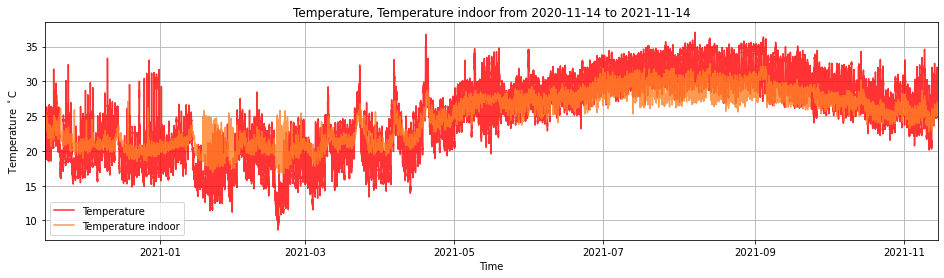

In [12]:
plot_all(weather, ['Temperature', 'Temperature indoor'])

This plot of raw data give me an imrpession that temperature data is ok, I'll check another field - pressure

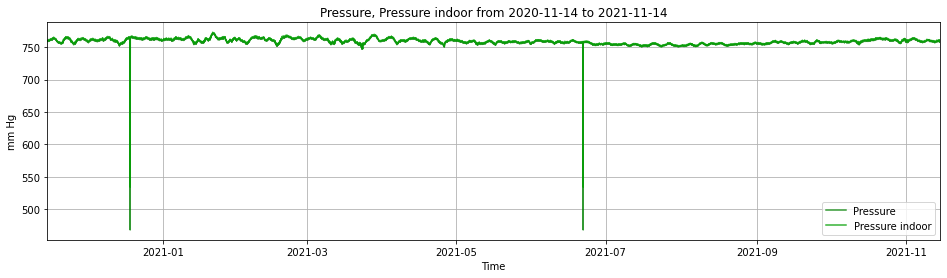

In [13]:
plot_all(weather, ['Pressure', 'Pressure indoor'])

Some outliers here, it's esy to fix. I can filter all values less than 500, but will implement more universal function copatible with all types of data and both low and large outliers - filter by n standard deviations

In [14]:
# remove ouliers over n sigmas
def outliers_remove(column, n_sigmas): 
    column_copy = column.copy()
    median = column.median()
    sigma = column.std()
    for i, v in column.iteritems():
        if v < median - sigma*n_sigmas or v > median + sigma*n_sigmas:
            new_v = (column.iloc[i-1] + column.iloc[i+1])/2
            print(f'fixing value #{i}, from {v} to {new_v}')
            column_copy.iloc[i] = new_v
    return column_copy

fixing value #9664, from 467.99 to 764.305
fixing value #62952, from 467.99 to 757.765
fixing value #9664, from 533.9 to 765.505
fixing value #62952, from 533.9 to 758.76


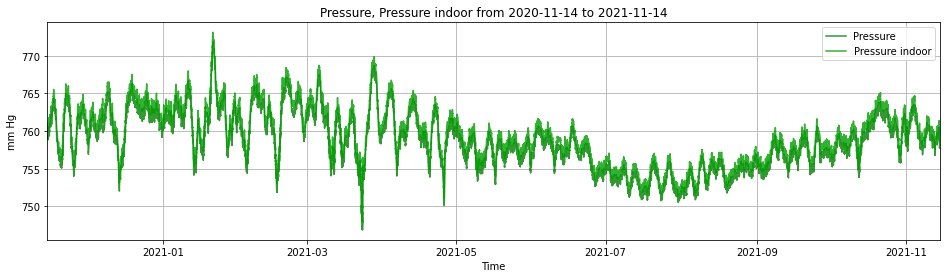

In [15]:
weather['Pressure'] = outliers_remove(weather['Pressure'], 4)
weather['Pressure indoor'] = outliers_remove(weather['Pressure indoor'], 4) # will fix for indoor too
plot_all(weather, ['Pressure', 'Pressure indoor'])

There is some difference between outdoor and indoor barometer data. Normally it should be the same. If the difference is constant I'll fix the oudoor data (usually it's less reliable because of more aggressive environment)

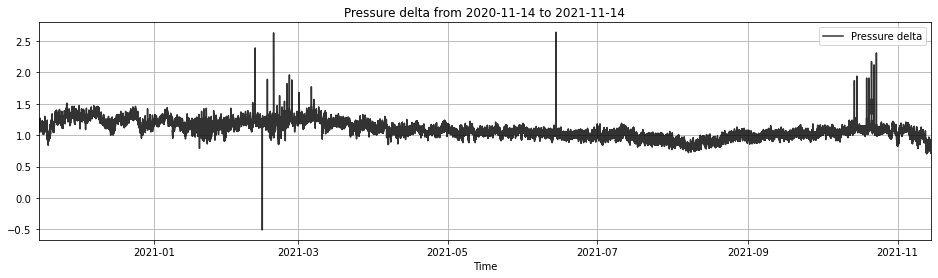

1.07000000000005

In [16]:
weather['Pressure delta'] = weather['Pressure indoor'] - weather['Pressure']
plot_all(weather, ['Pressure delta'])
weather['Pressure delta'].median()

I'll fix the outdoor data by this difference, it's not changing much by months

In [17]:
weather['Pressure'] = weather['Pressure'] + weather['Pressure delta'].median()

In [18]:
# plot_all(weather, ['Humidity indoor'])

## Plot some period <a class="anchor" id="plot_period"></a>

To have a closer look on temperature data I'll print one week from summer and another one from winter

In [19]:
#filter months or weeks
winter_week = weather[(weather['Month'] == 1) & (weather['Year'] == 2021) & (weather['Day'] < 8)]
summer_week = weather[(weather['Month'] == 8) & (weather['Year'] == 2021) & (weather['Day'] < 8)]

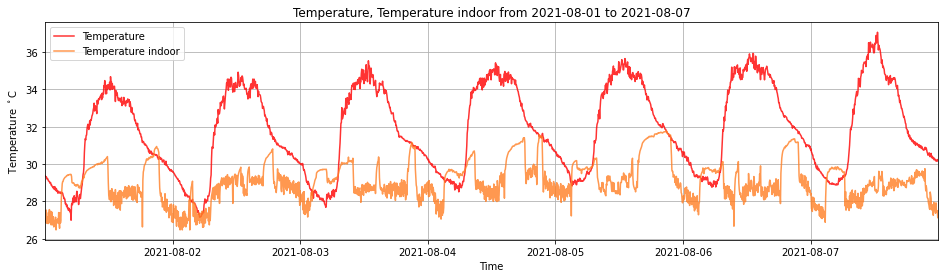

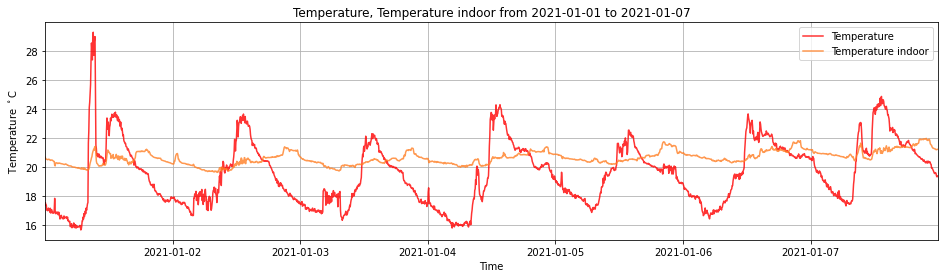

In [20]:
plot_all(summer_week, ['Temperature', 'Temperature indoor'])
plot_all(winter_week, ['Temperature', 'Temperature indoor'])

First plot shows one summer week, the second one shows winter week. <br>

Of course summer temperature is higher, more interesting here is the charachter of "teeths". <br>
**Outdoor temperature (red):<br>**
Summer's are more "fat", temperature level stays on the top for hours. Winter's "teeths" are more "sharp", there is only a short moment and than it's cooling down. Also I can compare how fast it heats in summer. 
<br><br>
**Indoor temperature (orange):<br>**
Summer indoor temperature is significantly lower than outdoor: easy to find effects of AC cooling.<br>
Winter indoor temperature is higher than outdoor most of the time, about 20-22 &deg;C, the line is far more flat than summer indoor temperature line.
<br><br>
Morning sun can heat the facade at winter very fast - it's first spike of 28 &deg;C at 01.01.<br>
At 03.01 I can spot how opened window at night influensed outdoor thermometer a little bit. 

All this is very specific, better look on aggregated data, like histograms

In [21]:
# plot_all(summer_week, ['Temperature delta'])
# plot_all(winter_week, ['Temperature delta'])

## Histograms for year data <a class="anchor" id="plot_hist"></a>

In [22]:
def plot_hist(df, fields):
    for field in fields:
        # get color and units
        color, units = get_field_meta(field)
        # max, min, Interquartile range
        field_data = df[field]

        # print data
        maximum = field_data.max()
        minimum = field_data.min()
        median = field_data.median()
        field_data_range = maximum - minimum

        print(f"{field} maximum: {round(maximum, 2)}, minimum: {round(minimum, 2)}, median: {round(median, 2)}")
        print(f"{field} range: {round(field_data_range, 2)}, IQR: {round(iqr(df[field]), 2)}")
        q1 = np.quantile(field_data, .25)
        q2 = np.quantile(field_data, .5)
        q3 = np.quantile(field_data, .75)
    
        # plot histograms
        ylim = len(df)/100
        bins = 400
        plt.figure(figsize=(8, 3))
        if field == 'Temperature' or field == 'Temperature indoor':
            plot_range = [8, 40]
        elif field == 'Temperature delta':
            plot_range = [-17, 15]
        else:
            plot_range = [min(field_data), max(field_data)]
               
        plt.hist(field_data, bins = bins, color=color, range=plot_range)
        plt.axvline(x=q1, label="Q1", c = '#133337', ls='--', alpha=.5)
        plt.axvline(x=q2, label="Q2", c = '#133337', ls='-', alpha=.5)
        plt.axvline(x=q3, label="Q3", c = '#133337', ls='--', alpha=.5)

        plt.title(field)
        plt.xlabel(units)
        plt.ylabel('count')
        plt.ylim([0, ylim])
        plt.grid(axis='x')
        plt.tight_layout()
        plt.show()

Plot histograms for all year

Temperature maximum: 37.06, minimum: 8.64, median: 25.47
Temperature range: 28.42, IQR: 9.22


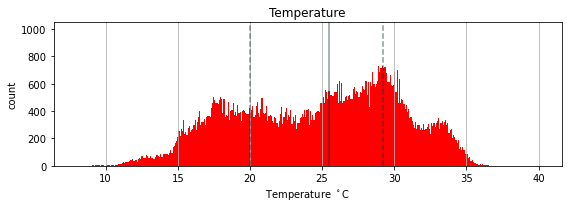

Temperature indoor maximum: 32.54, minimum: 16.74, median: 25.63
Temperature indoor range: 15.8, IQR: 7.01


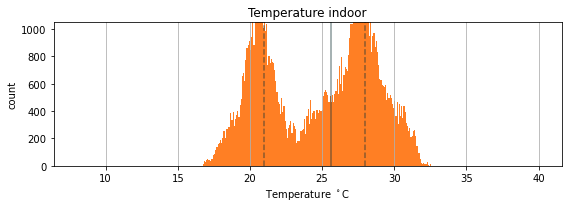

Temperature delta maximum: 14.24, minimum: -12.77, median: 0.37
Temperature delta range: 27.01, IQR: 3.43


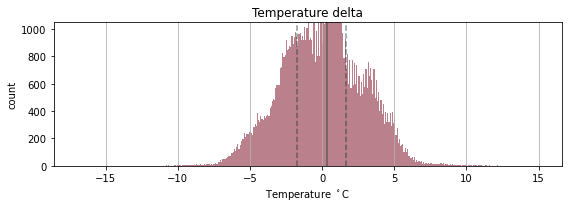

Pressure maximum: 772.96, minimum: 747.96, median: 759.46
Pressure range: 25.0, IQR: 5.61


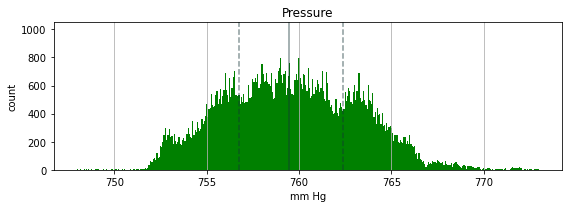

In [23]:
# plot_hist(weather, ['Temperature', 'Temperature indoor', 'Temperature delta', 'Pressure', 'Humidity indoor', 'Co2'])
plot_hist(weather, ['Temperature', 'Temperature indoor', 'Temperature delta', 'Pressure'])

Temperature inside and outside have different charachters (two spikes on indoor temp.).<br> I'll print it overlapped to compare closely

In [24]:
def plot_hist_over(df, fields):
    plt.figure(figsize=(8, 4))
    for field in fields:
        # get color and units
        color, units = get_field_meta(field)
        # max, min, Interquartile range
        field_data = df[field]
        q2 = np.quantile(field_data, .5)

        # plot histogramms
        if field == 'Temperature' or field == 'Temperature indoor':
            plot_range = [10, 40]
        elif field == 'Temperature delta':
            plot_range = [-17, 15]
        else:
            plot_range = [min(field_data), max(field_data)]

        sns.histplot(field_data, bins=100, color=color, kde=True, fill=False, binrange=plot_range ,stat='probability')
        plt.axvline(x=q2, label="Q2", c = color, ls='--', lw=1)
        title = ', '.join(fields) + f" from {df['Date'].min()} to {df['Date'].max()}"
        plt.title(title)
        plt.xlabel(units)
        plt.ylabel('count')
    
    legend = [fields[0], fields[0] + ' median', fields[1], fields[1] + ' median']
    plt.legend(legend)
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

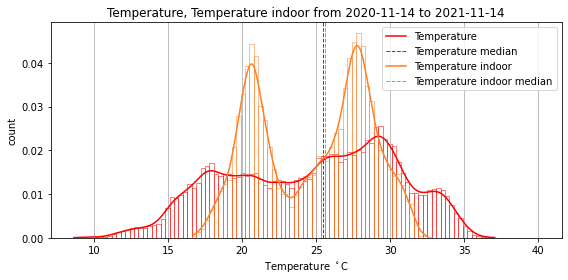

In [25]:
plot_hist_over(weather, ['Temperature', 'Temperature indoor'])

Medians are about the same, but distributions are not the same at all: outdoor is more normal, indoor have two distinguished peaks. The reason could be a season - in winter we heat it up till comfort temperature, in summer will cool down from the highest temperatures. <br>Now I will plot august and december to show those two peaks of indoor temperature separetely.

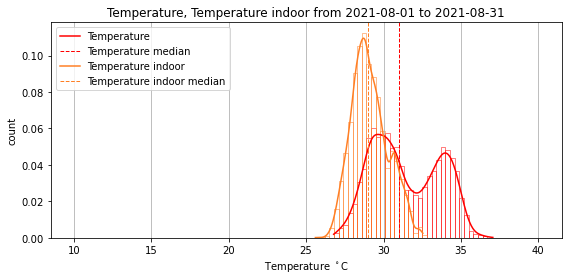

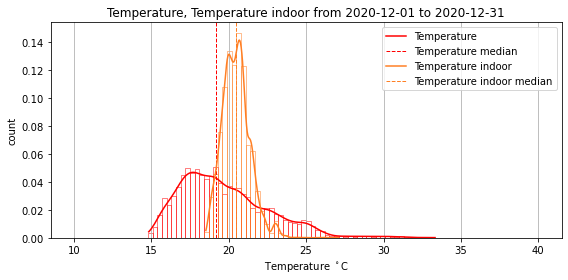

In [26]:
# filter months
august = weather[(weather['Month'] == 8) & (weather['Year'] == 2021)]
december = weather[(weather['Month'] == 12) & (weather['Year'] == 2020)]
# plots
plot_hist_over(august, ['Temperature', 'Temperature indoor'])
plot_hist_over(december, ['Temperature', 'Temperature indoor'])

Median of indoor temperature always closer to comfort temperature zone.<br> I want to show same distributions for all months in the next plot

## Data distributions by months - violin plots <a class="anchor" id="plot_violin"></a>

Instead of looking at one month I can plot them all together on the violin plot

In [27]:
def violinplot(df, fields, slicer):   
    # firts field for outdoor, second for indoor
    # construct the table fror violinplot
    plt.subplots(figsize=(16,6))
    if len(fields) == 2:
        outdoor = df[[slicer, fields[0]]].assign(Location='outdoor')
        indoor = df[[slicer, fields[1]]].assign(Location='indoor')
        new_name = fields[1].split(' ')[0]
        indoor = indoor.rename(columns={fields[1]: new_name})
        both_fields = pd.concat([outdoor, indoor])
        colors = [color_dict[fields[0]], color_dict[fields[1]]]
        # violin plot 
        sns.violinplot(x=both_fields[slicer],
                    y=both_fields[fields[0]],
                    hue=both_fields['Location'],
                    palette=colors,
                    split=True,
                    width=.95,
                    saturation=.7,
                    )
        
        plt.title(f'{fields[0]} distributions by {slicer.lower()}s, outdoor and indoor')           
        plt.ylim(np.percentile(both_fields[fields[0]], [0.03, 100]))    
        
    else:
        color = [color_dict[fields[0]]]
        sns.violinplot(x=df[slicer],
                y=df[fields[0]],
                palette=color,
                width=.95,
                saturation=.7,
                )
        plt.title(f'{fields[0]} distributions by months')           
        plt.ylim(np.percentile(df[fields[0]], [0.03, 100]))

    plt.grid()
    plt.show()

I could plot just average temperature by year, here I can show more than just average (or median) value, like distribution charachter for indoor and outdoor temperatures.

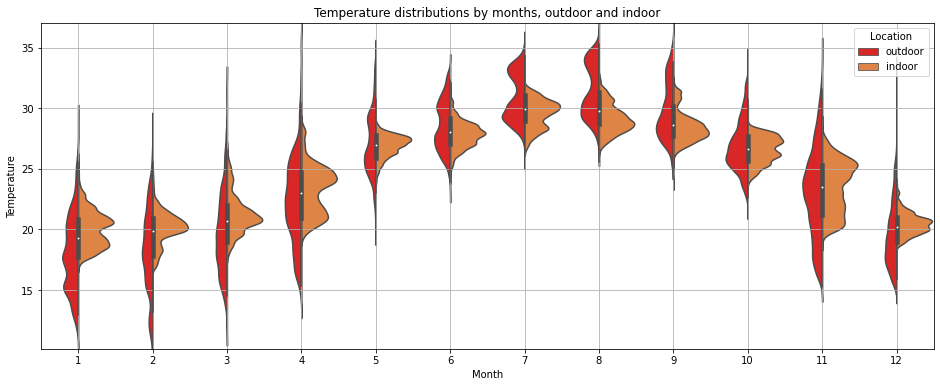

In [28]:
violinplot(weather, ['Temperature', 'Temperature indoor'], 'Month')

Here I have same trend showed over all year, by violin plot.<br>

In [29]:
# check bimodality of april - just got warmer after 6th of april, not so important
# april = weather[(weather['Month'] == 4) & (weather['Year'] == 2021)]
# violinplot(april, ['Temperature', 'Temperature indoor'], 'Hour')
# violinplot(april, ['Temperature', 'Temperature indoor'], 'Day')

Another values type will not have same shift, for example the pressure <br>*there are two sensors, inside and outside, and both generally will give same values, so differencies here are sensor's fluctuations*

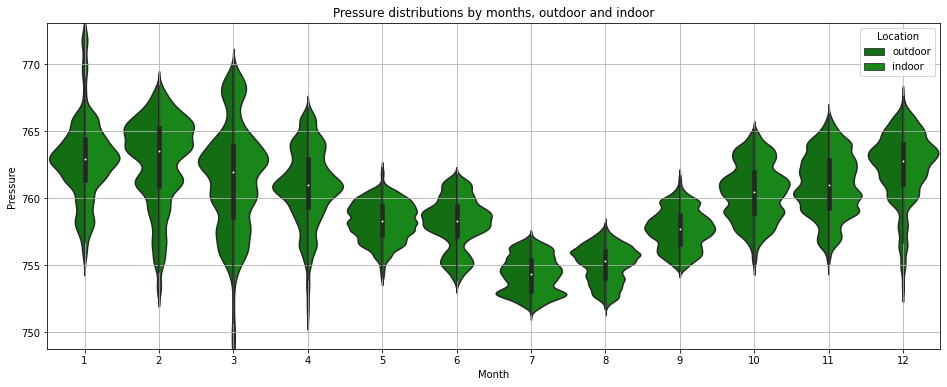

In [30]:
violinplot(weather, ['Pressure', 'Pressure indoor'], 'Month')

Pressure have negative correlation from the temperature - it is lower in summer and higher in wintertime

In [105]:
# violinplot for one value - temperature
# violinplot(weather, ['Temperature'], 'Month')

## Temperature and humidity on one chart <a class="anchor" id="plot_two"></a>

In range of one day I can find the negative correlation trend too. I'll plot temperature and humidity together on same scale

In [32]:
# two values together
def plot_two_fields(df, fields):
    fig = make_subplots(specs=[[{"secondary_y": True}]])
    
    color_1 = dict(color=get_field_meta(fields[1])[0])
    color_0 = dict(color=get_field_meta(fields[0])[0])
    
    fig.add_trace(
        go.Scatter(x=df.Datetime, y=df[fields[1]], name=fields[1], marker=color_1
                  ), secondary_y=False)
    fig.add_trace(
        go.Scatter(x=df.Datetime, y=df[fields[0]], name=fields[0], marker=color_0
                  ), secondary_y=True)
        
    fig.update_yaxes(title_text=get_field_meta(fields[0])[1], secondary_y=False)
    fig.update_yaxes(title_text=get_field_meta(fields[1])[1], secondary_y=True)
    
    fig.update_layout(
        title={
            'text': f'{fields[1]} and {fields[0]} graphs',
            'y':0.8,
            'x':0.45,
            'xanchor': 'center',
            'yanchor': 'top'
                },
        autosize=True,
        template='plotly_white'
    )

    # pl.offline.plot(fig, filename='Graphs/file.html')
    fig.show()

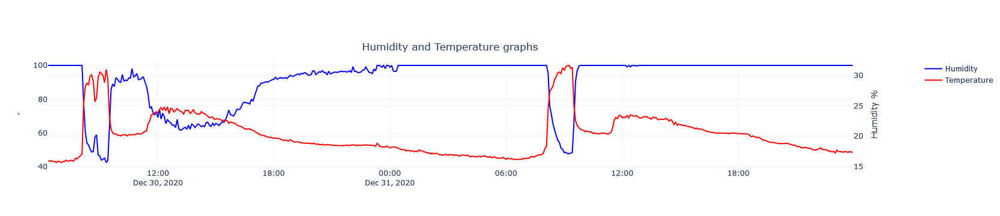

In [33]:
plot_two_fields(december.tail(500), ['Temperature', 'Humidity'])

Temperature curve looks almost as mirrored humidity curve, it's not only about the climate, maybe more about sensor location and properties.

In [34]:
# plot_two_fields(december.tail(500), ['Temperature', 'Pressure'])

There is something very authentic in raw data, thats why next plot will show all year data, sliced by days and colored by summer/winter period

## Every day temperature from one year <a class="anchor" id="plot_everyday"></a>

Number of functions to prepare the data and plot

In [35]:
#construct labels for hours
def labels_hours():
    labellist_h = []
    for i in range(24):
        hourtext = f"{i:02}"
        labellist_h.append(str(hourtext)+':00')
    return labellist_h

In [36]:
def mix_color(i):
    #r mix
    if i < 24:
        r = '0'+str(hex(int(i/1.44313)))[2:]
    else:
        r = str(hex(int(i/1.44313)))[2:]
    g = '59'
    #b mix
    if i < 345:
        b = str(hex(255-int(i/1.44313)))[2:]
    else:
        b = '0'+str(hex(int(255-i/1.44313)))[2:]
    return '#'+r+g+b

In [37]:
# multyline year # prepare data
def prep_data_div(df, field):
    setit = df[[field, 'Datetime']].copy(deep=True)
    setit['day_of_year'] = setit['Datetime'].dt.dayofyear

    counter = setit.day_of_year.iloc[0]
    counter_2 = 0
    setit_divided = []
    setit_divided_subset = []
    for i in range(len(setit)):
        if setit.day_of_year.iloc[i] == counter and counter_2 <= 287:
            setit_divided_subset.append(setit.iloc[i].values[0])
            counter_2 += 1
        else:
            setit_divided.append(setit_divided_subset)
            counter = setit.day_of_year.iloc[i]
            counter_2 = 0
            setit_divided_subset = []
    data = setit_divided[1:-1]
    return data

In [38]:
# plot multyline year
def plot_multyline_year(df, field):
    data = prep_data_div(df, field)
    
    plt.figure(figsize=(14, 8))
#     plt.figure(figsize=(20, 6))

    ax = plt.subplot()
    ax.set_xticks(range(288))

    y = data[0]
    ax.set_xticks([i for i in range(len(y)) if i % 12 == 0])
    ax.set_xticklabels(labels_hours(), rotation=90)
    
    # plot divider
    for i in range(len(data)):
        y = data[i]
        plt.plot(range(len(y)), y, color=mix_color(i), alpha=.12)

    plt.title(f'{field} graphs over all days of year  |  red for summer, blue for winter')
    plt.grid(color='gray', linestyle=':', linewidth=.5, animated = True)
    plt.xlabel('Hours of days')
    plt.ylabel(get_field_meta(field)[1], color=get_field_meta(field)[0])
    # plt.savefig('Graphs/Temperatures graphs over all days of year.png')
    plt.xlim(range(len(y))[0], range(len(y))[-1])
    if field in ['Temperature', 'Temperature indoor']:   
        plt.ylim([10, 37])
    plt.show()

There is a gradient from red (in summer) to blue (in winter).<br>
Colors here are different, not usual color coding for this notebook. Here I use the standard color of data type only on the y axis label, when main data colored by season of year. 

**Plotting outdoor temperature graphs over all days of year**

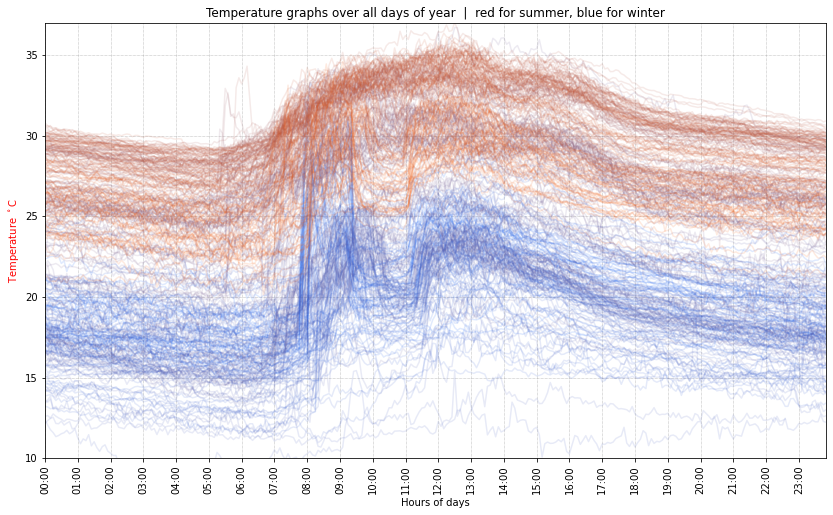

In [39]:
plot_multyline_year(weather, 'Temperature')

Obvious that utdoor temperature generally have clear up and down periods. Here I can catch more detailed changes. Temperature sensor located in shadow, but anyway sun on facade of building influencing it much:
* Day temperature graphs are more "noisy" than night, heating is more irregular than cooling
* Summer temperature graphs are more smoothed, than winter. Everything is warmer, less sudden changes
* There is a drop at 9-11, it's a shadow of other building prevents heating. Remarkable that in summer the shadow is too short and there is no drop there.
* The steep climbing of winter temperatures at 8 o'clock it's a first sunbeam heating the area after cold night<br>
I can conclude that it could be some better place or box for temperature sensor, even in shadow it exposed to heating.

**Plotting indoor temperature graphs over all days of year**

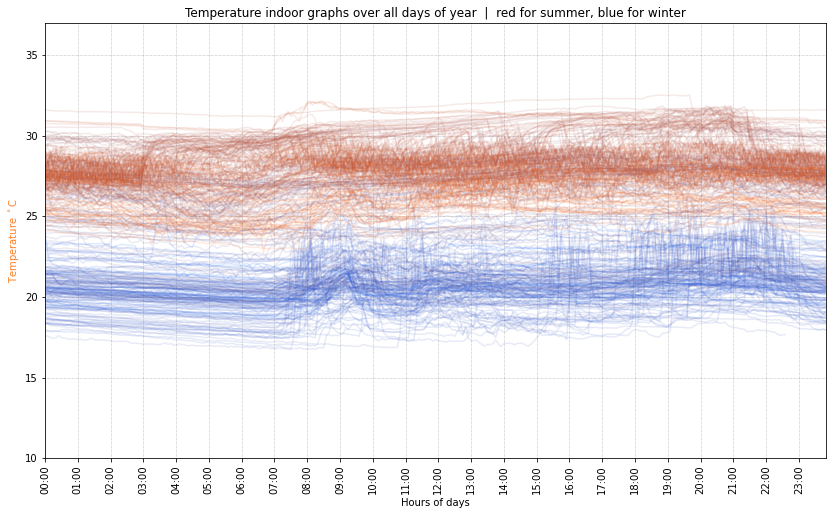

In [40]:
plot_multyline_year(weather, 'Temperature indoor')

* It's generally more flat (I intentionally plot it with same range to compare with outdoor data)
* Temperature values are concentrated at two zones, as I've seen on histogram plots before
* On winter data I can spot no space heating from 23 to 7 o'clock - calm natural cooling down.
* More space heating at 8-9 (clear concentration of spikes) and in evening, (even temperature is slightly) especially at 20-22 o'clock
* On summer data it's more about tne AC cooling: intense at 21-3 o'clock, less cooling at 3-8, more intense 

**Plotting pressure graphs over all days of year**<br>
Just to compare with another parameter, pressure (I can't influence at all by regular activity)

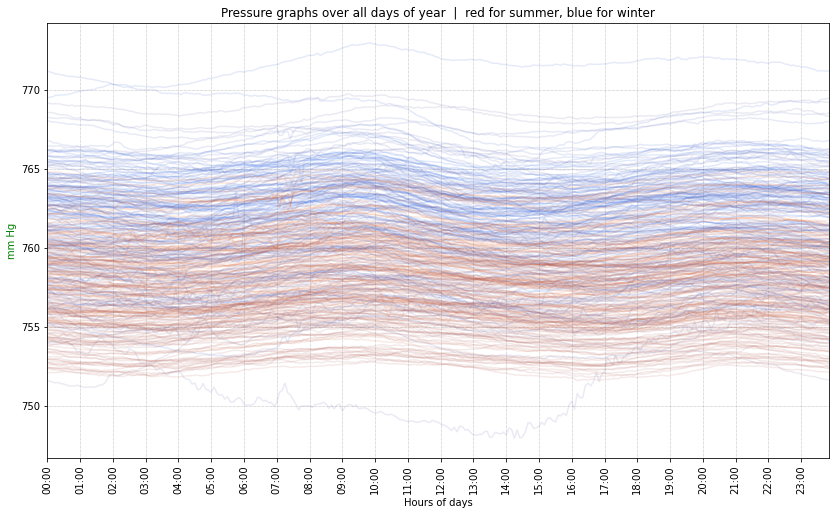

In [41]:
plot_multyline_year(weather, 'Pressure')

* Pressure graphs have a form of synchronized calm waves, almost no sudden changes (for the pressure thunderstorm can make a change)
* Year season trend is the opposite for the temperature - low winter and high summer, as I've seen on histograms. 
* Day trend correlating with sea breeze

# Time Series Analysis <a class="anchor" id="tsa"></a>

## Check aggregated data <a class="anchor" id="tsa_check"></a>

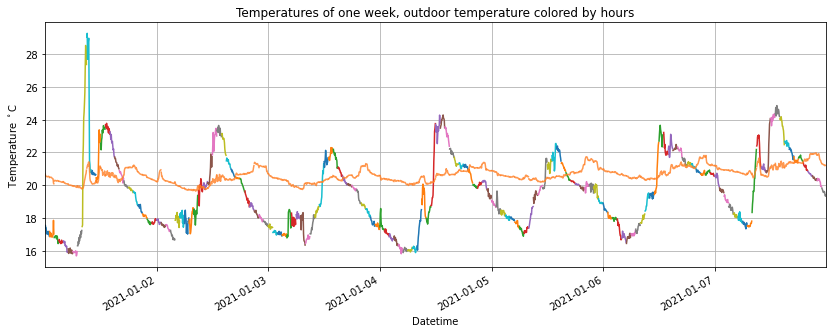

In [102]:
# plot colored by hours
plt.subplots(figsize=(14, 5))
winter_week.set_index("Datetime").resample(rule="H")['Temperature'].plot()
winter_week.set_index("Datetime").resample(rule="H")['Temperature indoor'].plot(c=get_field_meta('Temperature indoor')[0], alpha=.8)
plt.xlim(min(winter_week['Datetime']), max(winter_week['Datetime']))
plt.title('Temperatures of one week, outdoor temperature colored by hours')
plt.ylabel(get_field_meta('Temperature indoor')[1])
plt.grid()
plt.show()

Color distinguishing of different hours.<br> I wanted to check how constant peaks are in time of day and if morning spikes are still here after aggregation by hour. <br>
Outdoor temperature have more "nature" charachter, thats why I make TSA for outdoor 

## TSA <a class="anchor" id="tsa_tsa"></a>

I'll use STL library from statsmodels.tsa.seasonal.<br>
Will apply Season-Trend decomposition and will get the following componenets:
* Trend
* Season
* Residuals

The three month period is well suited to show the general trend and is still distinguish daily seasonal changes.<br>
Filter August-October and aggregate the data by hours:

In [46]:
period = weather[(weather['Month'].isin([8, 9, 10]))]
aggregated_h = period.set_index("Datetime").resample(rule="H")['Temperature'].min()

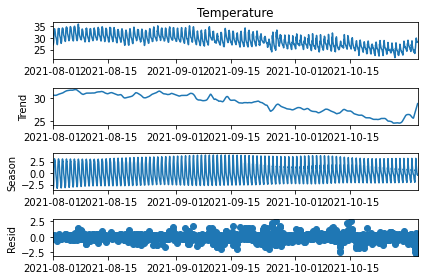

In [47]:
result = STL(aggregated_h, period=24, seasonal=21, robust=True).fit()
result.plot()
plt.show()

I want to plot some components on same scale and in general improve the visual.

### Plot the components of TSA <a class="anchor" id="tsa_comp"></a>

In [49]:
def aggregate(df, field):
    df_aggregated = df.set_index("Datetime").resample(rule="H")[field].mean()
    result = STL(df_aggregated, period=24, seasonal=21, robust=True).fit() # more settings can me provided for better result
    tsa = pd.concat([result.trend, result.seasonal, result.resid], 1)
    tsa['original'] = df_aggregated
    tsa = tsa[['original', 'trend', 'season', 'resid']]
    return tsa

In [50]:
def plot_tsa_components(df_raw, plot_list, field):
    plt.subplots(figsize=(16, 3))
    color, units = get_field_meta(field)
    clr_map = {'original': fade_color(color), 'trend': color, 'season': '#008b8b', 'resid': '#800000'}
    lw_map = {'original': 1, 'trend': 3, 'season': 1, 'resid': .5}
    legend = []
    df = aggregate(df_raw, field)
    for col in df.columns:
        if col in plot_list:
            ax = plt.plot(df.index, df[col], lw=lw_map[col], color=clr_map[col])
            legend.append(col)

    plt.ylabel(field)
    plt.xlabel('Time')
    plt.title(f'{field} TSA components by period')
    # x ticks
    x_tick_div = 24 * 2
    x_ticks = [df.index[x] for x in range(len(df)) if x%x_tick_div == 0]
    # labels
    lbl_list = [df.index[x].date() for x in range(len(df.index)) if x%x_tick_div == 0]
    plt.xticks(ticks = x_ticks, rotation=90, labels=lbl_list)
    plt.xlim(min(df.index), max(df.index)) # option only
    plt.grid()
    plt.legend(legend)
    plt.show()

In [51]:
# functions to fade the color
def hex_to_rgb(value):
    value = value.lstrip('#')
    lv = len(value)
    return tuple(int(value[i:i+lv//3], 16) for i in range(0, lv, lv//3))


def rgb_to_hex(rgb):
    return '%02x%02x%02x' % rgb


def fade_color(color):
    color_rgb = hex_to_rgb(color)
    mix_color = '#FFFFFF'
    mix_color_rgb = hex_to_rgb(mix_color)
    new_color = []
    for cl in enumerate(color_rgb):
        new_cl = int((cl[1] + 2*mix_color_rgb[cl[0]]) / 3)
        new_color.append(new_cl)
    new_color_hex = '#' + rgb_to_hex(tuple(new_color))
    return new_color_hex

In [52]:
def plot_tsa_components_all(period, field):
    plot_tsa_components(period, ['original', 'trend'], field)
    plot_tsa_components(period, ['resid', 'season'], field)

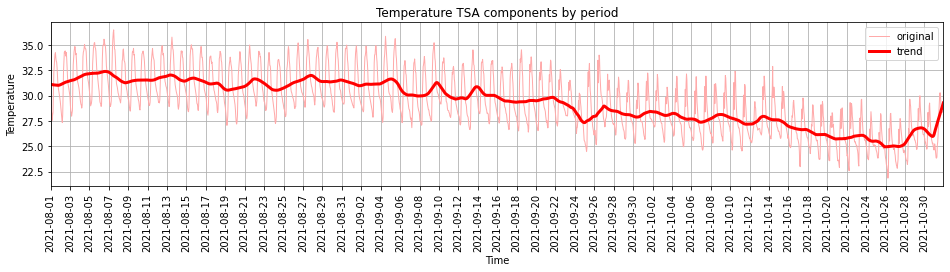

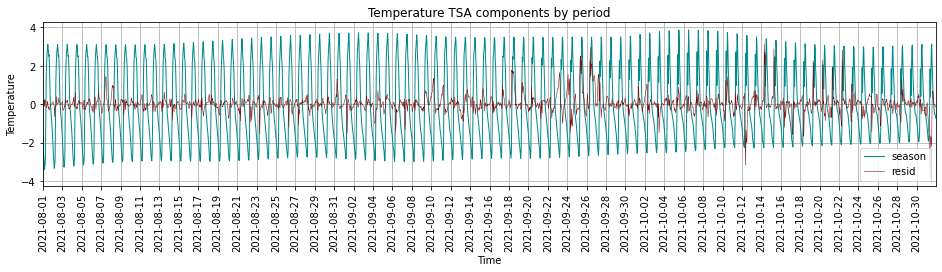

In [53]:
plot_tsa_components_all(period, 'Temperature')

There is the original data and the trend on the first plot.<br>
Trend line from August to October is goind down from 32 &deg;C to 25 &deg;C with some "jump" at the end.
On the second plot there are season changes (daily), and residual data. Notable how daily season changing is going down.<br>
Dayly change is about 5 &deg;C, three months trend change is about 6 &deg;C

The pressure trend is different, also daily changes are relatively low (about 1 mm Hg), when three months change is about 8 mm Hg. Fluctuations are stronger (residuals sometimes fall far from zero)

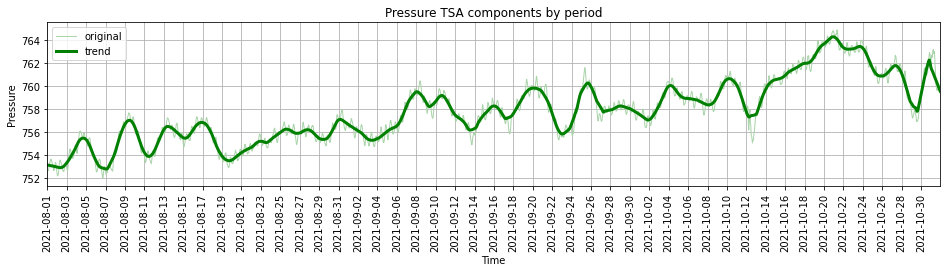

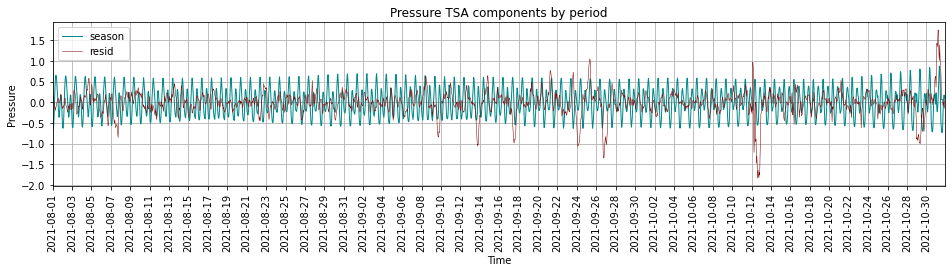

In [54]:
plot_tsa_components_all(period, 'Pressure')

After watching the trends, it is time for predictions!

# Prediction by Prophet <a class="anchor" id="prophet"></a>
*Prophet is a procedure for forecasting time series data*

## Preamble <a class="anchor" id="prophet_preamble"></a>
There is a charpter about weather forecasts in the book 'The Signal and the Noise' by Nate Silver. He sais that predictions improved drastically in last 25 years. But still, more than 9 days forecast in average not beat just historical climate data. It's even using complex models and a lot of data! So for day 10 is better just to check historical averages.
<br>**Maybe it's better now, the book written 10 years ago*<br>
This prediction wiil be much simpler usual commercial forecasts - I'll use only local temperature data for one year (close to persistance forecast method)

![SNOWFALL](http://www.randalolson.com/wp-content/uploads/weather-forecast-errors.png)

The illustration from the book, data courtesy of Eric Floehr at ForecastWatch.com, picture from Randy Olson post.<br>Climatology MAE is about 4 &deg;C

## Prepare the data <a class="anchor" id="prophet_prep"></a>

The data have some unwanted spikes (from winter mornings low sunbeams), I'll smooth it a little bit.

In [55]:
# smooth little bit
def smooth(df, field, window):
    color, units = get_field_meta(field)
    # smooth the column
    df_smth = df.copy()
    df_smth[field] = round(df[field].rolling(window=window, center=True).mean(), 2)
    df_smth = round(df_smth.fillna(df_smth.rolling(window+1, min_periods=1, center=True).mean()), 2)
    # plot to compare smoothed to original
    plt.subplots(figsize=(15, 4))
    plt.plot(df[df.columns[0]], df[field], alpha=.8, color=fade_color(color))
    plt.plot(df[df.columns[0]], df_smth[field], color=color)
    plt.grid()
    plt.ylabel(units)
    plt.title(f'{field} smoothing')
    plt.legend([f'{field} smoothed', f'{field} original'])
    plt.xlim(min(df[df.columns[0]]), max(df[df.columns[0]]))
    return df_smth

Test of smoothing on small period, to see the spikes and results of smoothing:

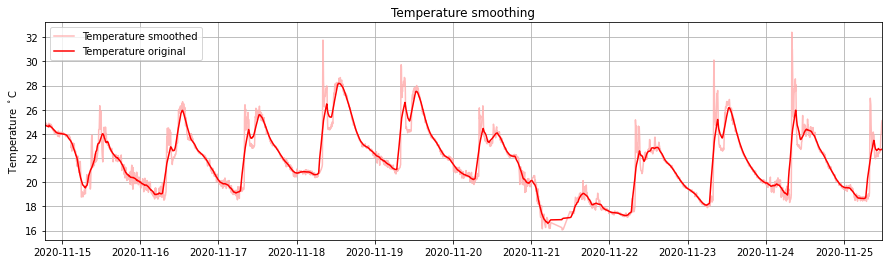

In [56]:
# test smooth data
metric_name = 'Temperature'
weather_pr = weather[['Datetime', metric_name]]
smoothed_test = smooth(weather_pr[:3000], metric_name, 30)

Looks good, `window=30` suits. Now smooth it all:

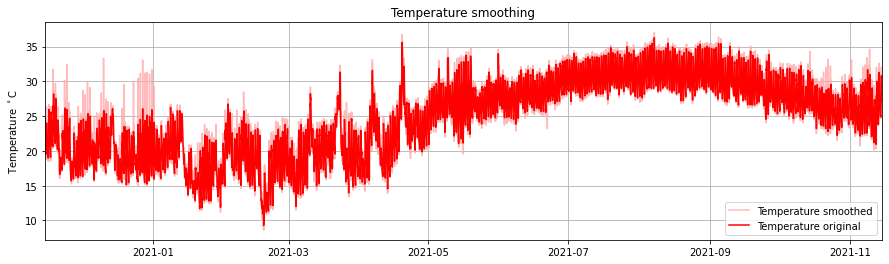

In [57]:
weather_pr_smooth = smooth(weather_pr, metric_name, 30)

I will resample temperature data by hours.<br> I could resample by it days, it would be much less data, but than prediction will be also more boring -  for days. <br>Also there is another thing I really want to plot - daily season.

In [73]:
# resample temperature by hours
df = weather_pr_smooth.set_index("Datetime").resample(rule="H")[metric_name].mean()
# df = weather_pr.set_index("Datetime").resample(rule="H")[metric_name].mean()
df = pd.DataFrame({'ds':df.index, 'y':df.values})
df.head()

,ds,y
0,2020-11-14 18:00:00,24.710000
1,2020-11-14 19:00:00,24.635000
2,2020-11-14 20:00:00,24.611667
3,2020-11-14 21:00:00,24.343333
4,2020-11-14 22:00:00,24.095000


## Prophet instantiating, fit, predict <a class="anchor" id="prophet_inst"></a>

Here I instantializing the Prophet object with settings for my data: 
* Smoothed yearly seasonality 
* Number of change points is 0, I want to keep the trend simple. All the year change will be expressed in yearly seasonality.
* No weekly seasonality - it's temperature, not clients, it don't care about weekdays
* Daily seasonality turned on
* Uncertainty intervals 50%

In [74]:
# instantiating a new Prophet object
m = Prophet(yearly_seasonality=True, # 3.0
            n_changepoints=0,
            weekly_seasonality=False,
            daily_seasonality=True,
            interval_width=0.5
           )

I pass the data and predict for 9 days (for reasons described in preambe to this part)<br> 

In [75]:
# call fit method and pass the data
m.fit(df)
# get a df that extends into the future a specified number of days, by method Prophet.make_future_dataframe
days = 9
periods = days * 24
future = m.make_future_dataframe(periods=periods, freq='H')
future.tail()

,ds
8972,2021-11-23 14:00:00
8973,2021-11-23 15:00:00
8974,2021-11-23 16:00:00
8975,2021-11-23 17:00:00
8976,2021-11-23 18:00:00


In [76]:
# The predict method will assign each row in future a predicted value which it names `yhat`
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
8972,2021-11-23 14:00:00,27.964568,26.823391,29.106709
8973,2021-11-23 15:00:00,27.438355,26.138654,28.626206
8974,2021-11-23 16:00:00,26.671074,25.504600,27.833000
8975,2021-11-23 17:00:00,25.883938,24.671368,27.099419
8976,2021-11-23 18:00:00,25.294218,24.119264,26.399701


## Interactive plots (plotly) <a class="anchor" id="prophet_plots"></a>

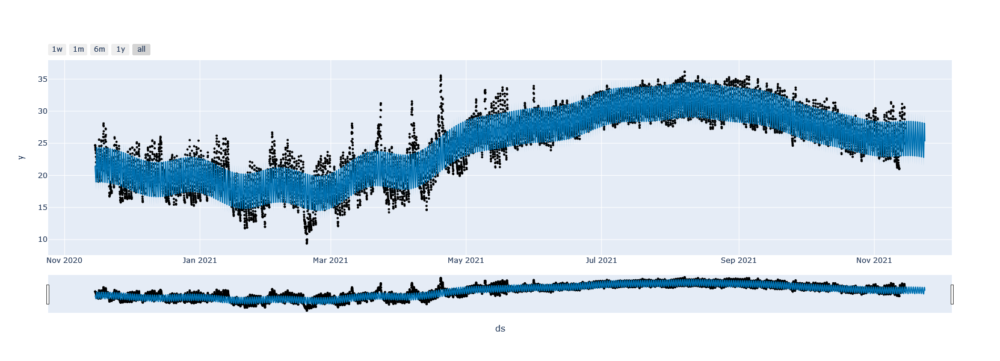

In [77]:
# fig1 = m.plot(forecast) # simple plt
plot_plotly(m, forecast)

The tamperature data looks overfitted to winter fluctuations.<br>
And about prediction - it's hard to see something here, fortunately it's scalable plotly chart! On the zoom to the right end (click on `1m` button) I can see better the black dots of real data (just smoothed a little bit), blue line of prediction and light blue for confidence interval

It is important to understand, which components are in this model after fitting the data with all settings: 

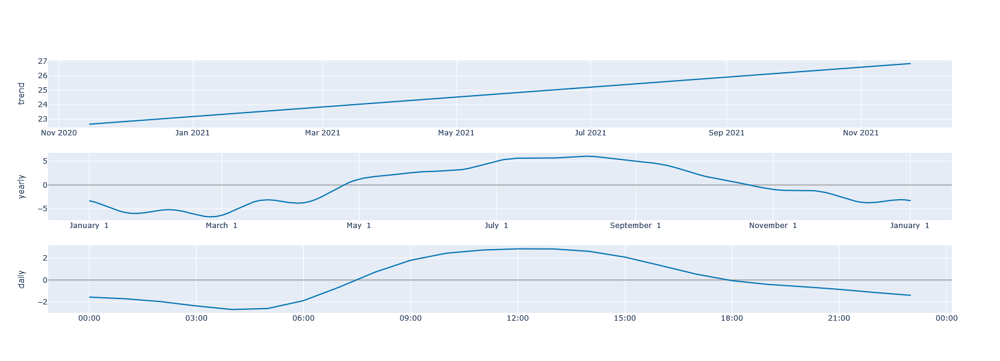

In [78]:
# the forecast components
plot_components_plotly(m, forecast)

The trend is flat (no changing points)<br>
Yearly season truly overfitted, and look at this little "bump" at the predicted part! Yearly seasonality is not smooth enough to predict out of train set, will fix it in further steps.
Daily season looks a like the year season generally. It's cold in early morning and warmer at the midday with less amplitude than year change. The charachter of the curve makes me think than longer day will not be much hot. (Maybe longer summer will do it, but it's only speculation)

## Cross-validation <a class="anchor" id="cross_val"></a>

Before I'll fix the year seasonality I want to get some metric to measure the improvement. There is an option that will no be improvement bacause of one year data, so obviously oferfitted it will give a best result on same data, but not for another data.
Prophet library have buit in cross validation function, it can take number of slices from the data to test it with itself.

In [79]:
# cross-validation
df_cv = cross_validation(m, initial='180 days', period='15 days', horizon = '30 days', parallel='processes')

INFO:prophet:Making 11 forecasts with cutoffs between 2021-05-18 18:00:00 and 2021-10-15 18:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x000001EEC30B2400>


In [80]:
# here is `yhat` - predictions where I have data to check
df_cv.tail()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
7915,2021-11-14 14:00:00,-15.522063,-16.670048,-14.354019,29.662500,2021-10-15 18:00:00
7916,2021-11-14 15:00:00,-16.061460,-17.285263,-14.992672,28.736667,2021-10-15 18:00:00
7917,2021-11-14 16:00:00,-16.849653,-18.133251,-15.757717,27.953333,2021-10-15 18:00:00
7918,2021-11-14 17:00:00,-17.675906,-18.824926,-16.522412,27.406667,2021-10-15 18:00:00
7919,2021-11-14 18:00:00,-18.318612,-19.467577,-17.093340,27.301000,2021-10-15 18:00:00


In [81]:
# get metrics on different horizons of prediction
df_p = performance_metrics(df_cv, rolling_window = .1)

I want to check `mae` (Mean Absolute Error) for day 10.<br>
Usually MAE from historical data is about 4&deg;C. Will it be larger than 4 &deg;C on day 10?

In [82]:
df_p[:24*8][['horizon', 'mae', 'mape']] # till day 10
# df_p

,horizon,mae,mape
0,3 days 00:00:00,2.625610,0.088616
1,3 days 01:00:00,2.677333,0.090378
2,3 days 02:00:00,2.728195,0.092114
3,3 days 03:00:00,2.779693,0.093884
4,3 days 04:00:00,2.832814,0.095727
...,...,...,...
187,10 days 19:00:00,32.854041,1.095863
188,10 days 20:00:00,33.160710,1.105130
189,10 days 21:00:00,33.468982,1.114526
190,10 days 22:00:00,33.779200,1.124161


`mae` - on day 10 it is 34&deg;C, far more than 4&deg;C!<br> 
Bad news - the performance is terrible, definitely can't use model as it is.

Here I plot MAE for one month to show how error range is growing with time:

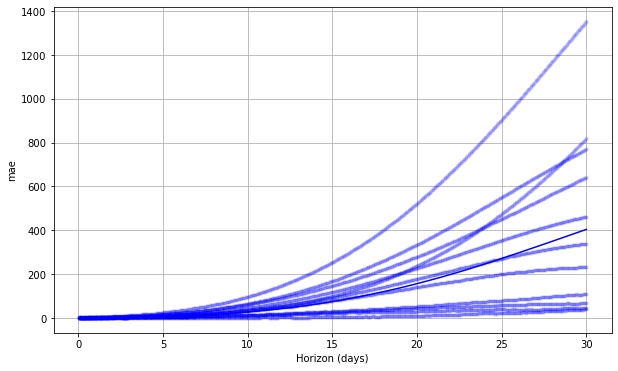

In [83]:
## visualising metrics
# fig1 = plot_cross_validation_metric(df_cv, metric='mape') # mean absolute percentage error
fig2 = plot_cross_validation_metric(df_cv, metric='mae') # mean absolute error

The charachter of error distribution is too linear, it should be more "chaotic".<br>
It's hard to see here how the average predicted temperature is wrong on day 10, but is' not important, all results are just too far from reality. <br> There are also good news: I know how to improve it - to tune hyperparameters.

## Hyperparameter tuning <a class="anchor" id="hyper_tune"></a>
I can tune some hyperparameters to get better results: I want to tune daily and yearly seasonalities' float parameters (number of Fourier terms)

In [84]:
# Check different combinations of parameters
import itertools
param_grid = {  
    'yearly_seasonality': [1.0, 3.0, 5.0],
    'daily_seasonality': [3.0, 4.0, 5.0, 6.0],
}
# Create all parameters combinations
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
mapes = []  # for MAPE metric

In [85]:
all_params

[{'yearly_seasonality': 1.0, 'daily_seasonality': 3.0},
 {'yearly_seasonality': 1.0, 'daily_seasonality': 4.0},
 {'yearly_seasonality': 1.0, 'daily_seasonality': 5.0},
 {'yearly_seasonality': 1.0, 'daily_seasonality': 6.0},
 {'yearly_seasonality': 3.0, 'daily_seasonality': 3.0},
 {'yearly_seasonality': 3.0, 'daily_seasonality': 4.0},
 {'yearly_seasonality': 3.0, 'daily_seasonality': 5.0},
 {'yearly_seasonality': 3.0, 'daily_seasonality': 6.0},
 {'yearly_seasonality': 5.0, 'daily_seasonality': 3.0},
 {'yearly_seasonality': 5.0, 'daily_seasonality': 4.0},
 {'yearly_seasonality': 5.0, 'daily_seasonality': 5.0},
 {'yearly_seasonality': 5.0, 'daily_seasonality': 6.0}]

In [86]:
# Run cross-validation with all parameter combinations
for params in all_params:
    m = Prophet(**params, 
                n_changepoints=0,
                weekly_seasonality=False, 
               ).fit(df)  # Fit model with given params
    df_cv = cross_validation(m, initial='180 days', period='15 days', horizon = '30 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1) # 1 for all horizon
    mapes.append(df_p['mape'].values[0])

# Check results with different parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['mape'] = mapes
print(tuning_results)

INFO:prophet:Making 11 forecasts with cutoffs between 2021-05-18 18:00:00 and 2021-10-15 18:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x000001EEC30B2E50>
INFO:prophet:Making 11 forecasts with cutoffs between 2021-05-18 18:00:00 and 2021-10-15 18:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x000001EEBCB4DD00>
INFO:prophet:Making 11 forecasts with cutoffs between 2021-05-18 18:00:00 and 2021-10-15 18:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x000001EEC2CF3AC0>
INFO:prophet:Making 11 forecasts with cutoffs between 2021-05-18 18:00:00 and 2021-10-15 18:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x000001EEC2EAF910>
INFO:prophet:Making 11 forecasts with cutoffs between 2021-05-18 18:00:00 and 2021-10-15 18:00:00
INFO:prophet:Applying in parallel with <co

    yearly_seasonality  daily_seasonality      mape
0                  1.0                3.0  0.037202
1                  1.0                4.0  0.036905
2                  1.0                5.0  0.036927
3                  1.0                6.0  0.036910
4                  3.0                3.0  0.078927
5                  3.0                4.0  0.087627
6                  3.0                5.0  0.099164
7                  3.0                6.0  0.096846
8                  5.0                3.0  0.285564
9                  5.0                4.0  0.230533
10                 5.0                5.0  0.307821
11                 5.0                6.0  0.280027


In [87]:
# Show best parameters
best_params = all_params[np.argmin(mapes)]
print(best_params)
best_yearly_seasonality = best_params['yearly_seasonality']
best_daily_seasonality = best_params['daily_seasonality']

{'yearly_seasonality': 1.0, 'daily_seasonality': 4.0}


Those parameters are very promising, how I'll plot all charts and tables after fitting on updated model

In [88]:
# best_yearly_seasonality = 1.0
# best_daily_seasonality = 4.0

## Fit and cross-validation with improved parameters <a class="anchor" id="fit_better"></a>

In [89]:
# Set Prophet with better parameters
m = Prophet(yearly_seasonality=best_yearly_seasonality,
            daily_seasonality=best_daily_seasonality,
            n_changepoints=0,
            weekly_seasonality=False,
            interval_width=0.5,
            )
m.fit(df) 

In [90]:
future = m.make_future_dataframe(periods=days*24, freq='H')
forecast = m.predict(future)

### Forecast plots <a class="anchor" id="p_plots"></a>

#### Plot all the data <a class="anchor" id="p_plot_all"></a>

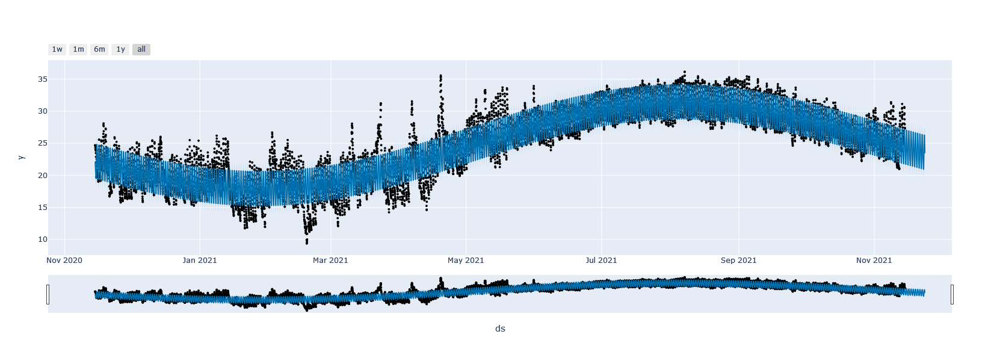

In [91]:
plot_plotly(m, forecast)

#### Plot components <a class="anchor" id="p_plot_comp"></a>

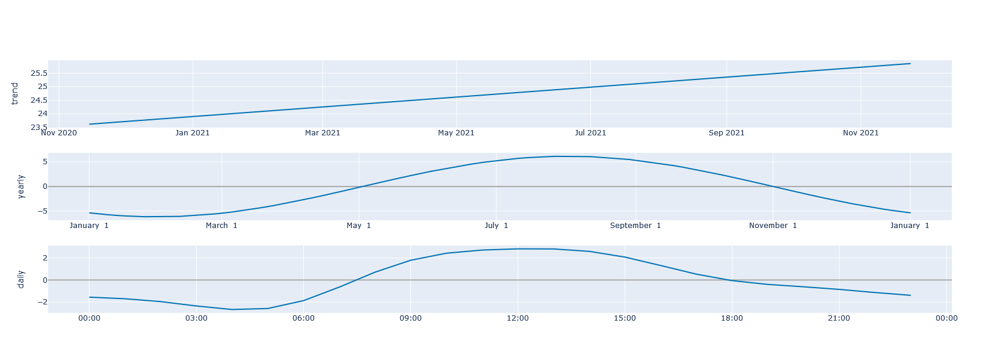

In [92]:
plot_components_plotly(m, forecast)

Yearly season line now is smooth enough! Now it's not overfitted as it was before. Predicted temperatures are going down, as it should be.<br> The range is 12 &deg;C. Intersection of line with 0 level naturally delayed after equinox. The charachter of line hints at a system with saturation, but the climate system is too complicated to do such conclusion from some curve.<br>

<br>The daily season hasn't changed much.

### Cross-validation <a class="anchor" id="cross_val_2"></a>

In [93]:
# cross-validation
df_cv = cross_validation(m, initial='180 days', period='15 days', horizon ='30 days', parallel='processes')

INFO:prophet:Making 11 forecasts with cutoffs between 2021-05-18 18:00:00 and 2021-10-15 18:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x000001EEC3AA35B0>


So what about `mae` for day 10 now? Will it be so far from 4 &deg;C as before?<br>
*Usually MAE from historical data is about 4&deg;C.*

In [94]:
# performance metrics
df_p = performance_metrics(df_cv, rolling_window = .1)
df_p[:24*8][['horizon', 'mae', 'mape']] # till day 10

,horizon,mae,mape
0,3 days 00:00:00,0.858005,0.030088
1,3 days 01:00:00,0.858761,0.030101
2,3 days 02:00:00,0.858537,0.030074
3,3 days 03:00:00,0.857979,0.030034
4,3 days 04:00:00,0.857503,0.029998
...,...,...,...
187,10 days 19:00:00,0.896133,0.031543
188,10 days 20:00:00,0.898349,0.031624
189,10 days 21:00:00,0.902079,0.031755
190,10 days 22:00:00,0.907364,0.031937


**Drastically better now!**<br>
After tuning daily and yearly seasonality (mostly yearly) this model really doing well. <br>
The `mae` level is under 4 &deg;C (forecast form historic climate data error). Good result!<br>
Keeping in mind that `mae` is averaged, and this forecast have only temperature. As well I'm sure there is still significant level of overfit here. Next time I could collect more data to check it on different years.

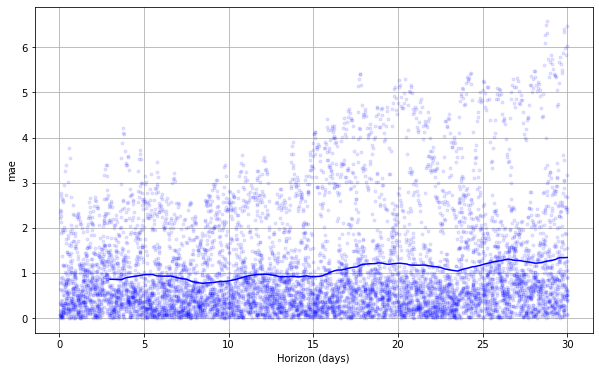

In [95]:
fig2 = plot_cross_validation_metric(df_cv, metric='mae') # mean absolute error

This is the plot of `mae` (Mean Absolute Error) in &deg;C for different horizons

# Conclusion <a class="anchor" id="conc"></a>

In first part (Visualization) I shown how different parameters of environment are connected, like temperature outdoor and indoor (also AC showed up here)
, temperature and humidity, on the year scale trere are pressure and temperatue - global climate dynamic. All the year sliced daily shown local peculiarities.<br>
<br>
The part about prediction sais that it is possible to build simple model on the data I have. Obviously more seasons will improve it. It can't be compared with commertial forecasts both by it's scale and complexity. Aniway it demonstrated how simple history log could be a base for satisfactory prediction.

# Next steps <a class="anchor" id="next"></a>
* Explore the differences of outdoor and indoor temperatures and schedule/power consumption of AC unit.
* Collect more data to test on couple of years al least. Several seasons of historical data will provide better material to feed the model and to validate it.
* Add Box-Cox Transform to achieve better performance